# Images-Draw Classifier

## Common Setup

In [ ]:
#!pip install imgaug
!pip install git+https://github.com/aleju/imgaug.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/aleju/imgaug.git to /tmp/pip-req-build-tlz3duyq
  Running command git clone --filter=blob:none --quiet https://github.com/aleju/imgaug.git /tmp/pip-req-build-tlz3duyq
  Resolved https://github.com/aleju/imgaug.git to commit 0101108d4fed06bc5056c4a03e2bcb0216dac326
  Preparing metadata (setup.py) ... done


In [ ]:
!pip install keras-tuner -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 12.7 MB/s eta 0:00:00


In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from keras import backend as K
import pathlib
from matplotlib import pyplot as plt

from tensorflow.keras.applications import ResNet50, VGG16

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

from collections import Counter
import imgaug as ia
import imgaug.augmenters as iaa
import imageio
import keras_tuner as kt
from keras.utils.vis_utils import plot_model
import gc
from pathlib import Path
import imghdr
import glob
from multiprocessing import Pool
from PIL import Image

In [ ]:
!pip list | grep tensorflow

tensorflow                    2.12.0
tensorflow-datasets           4.9.2
tensorflow-estimator          2.12.0
tensorflow-gcs-config         2.12.0
tensorflow-hub                0.13.0
tensorflow-io-gcs-filesystem  0.32.0
tensorflow-metadata           1.13.1
tensorflow-probability        0.20.1


In [ ]:
#tf.compat.v1.enable_eager_execution()

In [ ]:
!rm -r sample_data

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive',force_remount=True)

Mounted at /content/gdrive


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
batch_size = 32
img_height = 224
img_width = 224
layers = 3
#n_classes= 5

In [ ]:
transf_list= [
    iaa.Fliplr(1),
    iaa.Flipud(1),
    iaa.Affine(rotate=(-45, 45)),
    iaa.Affine(rotate=(-90, 90)),
    iaa.Affine(scale=(0.5, 2.0)),
    iaa.GaussianBlur(sigma=(0.0, 3.0)),
    iaa.BlendAlpha((0.0, 1.0),foreground=iaa.Add(100),background=iaa.Multiply(0.2)),
    #iaa.LogContrast(gain=(0.6, 1.4)),
    iaa.AdditiveGaussianNoise(scale=(0, 0.2*255)),
    iaa.AdditiveLaplaceNoise(scale=(0, 0.2*255)),
    iaa.MultiplyElementwise((0.5, 1.5)),
    iaa.Cutout(nb_iterations=(1, 5), size=0.2, squared=False),
    iaa.Cutout(fill_mode="constant", cval=255),
    iaa.Dropout(p=(0, 0.2)),
    iaa.CoarseDropout((0.0, 0.05), size_percent=(0.02, 0.25)),
    iaa.ReplaceElementwise(0.1, [0, 255]),
    iaa.Salt(0.1),
    iaa.Pepper(0.1),
    ]

# iaa.Sometimes(5 / 6, iaa.OneOf
seq = iaa.OneOf(transf_list)

seq_old = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontal flips
    iaa.Crop(percent=(0, 0.1)), # random crops
    # Small gaussian blur with random sigma between 0 and 0.5.
    # But we only blur about 50% of all images.
    iaa.Sometimes(
        0.2, #0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    # Strengthen or weaken the contrast in each image.
    iaa.LinearContrast((0.75, 1.5)),

    # Add gaussian noise.
    # For 50% of all images, we sample the noise once per pixel.
    # For the other 50% of all images, we sample the noise per pixel AND
    # channel. This can change the color (not only brightness) of the
    # pixels.
    iaa.Sometimes(
        0.2, #0.5,
        iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5)
    ),
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-25, 25),
        shear=(-8, 8)
    )
], random_order=True) # apply augmenters in random order



def get_label(file_path):
  # Convert the path to a list of path components
  parts = tf.strings.split(file_path, os.path.sep)
  # The second to last is the class-directory
  # print (parts)
  one_hot = parts[-2] == class_names
  # Integer encode the label
  return tf.argmax(one_hot)

def decode_img(img,img_height, img_width, channels=3):
  # Convert the compressed string to a 3D uint8 tensor
  img= tf.io.decode_jpeg(img, channels= channels )

  # Resize the image to the desired size
  img= tf.image.resize(img, [img_height, img_width])
  return  tf.cast(img, np.uint8)

def process_path(file_path,img_height=224, img_width=224):
  label= get_label(file_path)
  #print('lab', label, 'file',file_path)
  # Load the raw data from the file as a string
  img = tf.io.read_file( file_path)
  img = decode_img(img, img_height, img_width)
  return img, label

def get_images_filename(data_dir='./'):
  '''
  Get image filenames in tensorflow data
  Return class weight array, list of image filename, list of labels

  weight class w_j= total_number_samples / (n_classes * n_samples_j)
  '''
  sub_dir_list=[x[0] for x in os.walk(data_dir)]
  sub_dir_list.sort()
  sub_dir_list= sub_dir_list[1:]

  t_image_count = len(list(data_dir.glob('*/*.jpg')))
  n_classes=len(sub_dir_list)
  print('Classes', n_classes)
  cl_weights={}
  img_l=[]  #image file list
  lab_l=[]  #label list

  for i, dir in enumerate(sub_dir_list):
    #dir= sub_dir_list[i]
    image_count= len(list(pathlib.Path(dir).glob('*.jpg')))
    c_w = t_image_count/(n_classes*image_count)
    cl_weights[i]= c_w
    fold_file_list = tf.data.Dataset.list_files(dir+'/*.jpg', shuffle=False)
    img_l.append(fold_file_list)
    lab_l.append([i]*image_count) #append image labels
    print('Folder', dir,', index',i,'images',image_count,'weight import.', round(c_w,3))
  print('Tot num. of images:', t_image_count)

  # 1. create dataset where each element is a `tf.data.Dataset` object
  img_ds = tf.data.Dataset.from_tensor_slices(img_l)
  # 2. extract all elements from datasets and concat them into one dataset
  concat_img_ds = img_ds.interleave(lambda x: x, cycle_length=1, num_parallel_calls=tf.data.AUTOTUNE)
  #concat_img_ds = np.array(list(concat_img_ds.as_numpy_iterator())).reshape(-1, 1) <--- used for balance data

  lab_l= [x for xs in lab_l for x in xs] #flat the list

  return cl_weights, concat_img_ds, lab_l

def configure_for_performance(ds, batch_size=8, at=AUTOTUNE):
  ds = ds.cache()
  ds = ds.shuffle( buffer_size=5000)
  ds = ds.batch(batch_size)
  ds = ds.prefetch(buffer_size=at)
  return ds

In [ ]:
#Metrics
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [ ]:
#Final check of files integrity

def CheckOne(f, verbose=False):
    try:
        im = Image.open(f)
        im.verify()
        im.close()
        if verbose:
          print(f"OK: {f}")
        return
    except (IOError, OSError, Image.DecompressionBombError):
        print(f"Fail: {f}")
        return f

In [ ]:
def augment_ds(train_ds, n=3):
  '''
  train_ds is images and labels
  n is the number of times to augment
  Return: original dataset + n augmented times of the. dataset
  train_ds+n*augmented_ds
  '''

  #Take list of images from dataset
  images_to_aug= np.array(list(train_ds.as_numpy_iterator()),dtype=object)
  labels= images_to_aug[:,1]
  images_to_aug= images_to_aug[:,0]
  #From list of images to array
  images_to_aug= np.stack(images_to_aug)
  #Augment data
  for i in range(n):
    print('Loop n',i)
    aug_images= seq(images=images_to_aug) #seq_old(images=images_to_aug)
    print(aug_images.shape, labels.shape)
    labels=labels.astype(int)
    #aug_images= aug_images.astype('float32')
    #Concatenate to the first one
    train_ds= train_ds.concatenate(tf.data.Dataset.from_tensor_slices((aug_images, labels)))

  return train_ds

In [ ]:
def decode_img_pred(img):
  # Convert the compressed string to a 3D uint8 tensor
  img = tf.io.decode_jpeg(img, channels=3)
  # Resize the image to the desired size
  return tf.image.resize(img, [img_height, img_width])

def process_path_pred(file_path):
  # Load the raw data from the file as a string
  img = tf.io.read_file(file_path)
  img = decode_img_pred(img)
  return img

## Def Model to tune
[Doc keras tuner](https://towardsdatascience.com/hyperparameter-tuning-with-kerastuner-and-tensorflow-c4a4d690b31a)

In [ ]:
def create_model(pretrain_mod='res',
                 pretrain_trainable= False,
                 units= 512,
                 num_layers= 3,
                 activation= 'relu',
                 dropout=[0.1,0.1],
                 global_pooling= 'max',
                 learning_rate = 1e-3,
                 opt_type= 'Adam'
                 ):
  # Initialize the Pretrained Model
  if pretrain_mod== 'res':
    feature_extractor = ResNet50(weights='imagenet',
                                input_shape=(224, 224, 3),
                                include_top=False)
  else:
    feature_extractor = VGG16(weights='imagenet',
                                input_shape=(224, 224, 3),
                                include_top=False)

  # Set this parameter to make sure it's not being trained
  feature_extractor.trainable = pretrain_trainable

  # Set the input layer
  input_ = tf.keras.Input(shape=(224, 224, 3))

  # Rescaling
  x = tf.keras.layers.Rescaling(1./255) (input_)

  # Set the feature extractor layer
  x = feature_extractor(x , training=pretrain_trainable)

  # Set the pooling layer
  if global_pooling == 'max':
    x = tf.keras.layers.GlobalMaxPooling2D(name= 'feature')(x)
  elif global_pooling == 'avg':
    x = tf.keras.layers.GlobalAveragePooling2D(name= 'feature')(x)
  else:
    #Flat layers
    x = tf.keras.layers.Flatten(name= 'feature')(x)

  # Tune the number of hidden layers and units in each.
  # Number of hidden layers: 1 - 5
  # Number of Units: 64 - 512 with stepsize of 32

  for i in range(1, num_layers):
    u_val =units // i
    x= tf.keras.layers.Dense(units=u_val,
                             activation= activation,
                             trainable= not(pretrain_trainable))(x)
    # Tune dropout layer with values from 0 - 0.3 with stepsize of 0.1.
    x= tf.keras.layers.Dropout(dropout[i-1]) (x)



  # Set the final layer with sigmoid activation function
  output_ = tf.keras.layers.Dense(1, activation='sigmoid', trainable= not(pretrain_trainable))(x)

  # Create the new model object
  model = tf.keras.Model(input_, output_)

  if opt_type =='Adam':
    opt=tf.keras.optimizers.legacy.Adam(learning_rate= learning_rate)   #tf.keras.optimizers.Adam(learning_rate= learning_rate)
  elif opt_type =='SGD':
    opt=tf.keras.optimizers.SGD(learning_rate= learning_rate)

  # Compile it
  model.compile(optimizer= opt,
                loss='binary_crossentropy',
                metrics=['accuracy',f1_m])

  return model



In [ ]:
#_mod ha lo strato di pooling alla fine per cercare di mantenere piu features
#l'idea però non da i risultati attesi

def create_model_mod(pretrain_mod='res',
                 pretrain_trainable= False,
                 units= 512,
                 num_layers= 3,
                 activation= 'relu',
                 dropout=[0.1,0.1],
                 global_pooling= 'max',
                 learning_rate = 1e-3,
                 opt_type= 'Adam'
                 ):
  # Initialize the Pretrained Model
  if pretrain_mod== 'res':
    feature_extractor = ResNet50(weights='imagenet',
                                input_shape=(224, 224, 3),
                                include_top=False)
  else:
    feature_extractor = VGG16(weights='imagenet',
                                input_shape=(224, 224, 3),
                                include_top=False)

  # Set this parameter to make sure it's not being trained
  feature_extractor.trainable = pretrain_trainable

  # Set the input layer
  input_ = tf.keras.Input(shape=(224, 224, 3))

  # Rescaling
  x = tf.keras.layers.Rescaling(1./255) (input_)

  # Set the feature extractor layer
  x = feature_extractor(x , training=pretrain_trainable)

  # Tune the number of hidden layers and units in each.
  # Number of hidden layers: 1 - 5
  # Number of Units: 64 - 512 with stepsize of 32

  #First Dens layers
  for i in range(1, num_layers):
    if i==1:
      name='feature'
    else:
      name='Dense_'+str(i)
    u_val =units // i
    x= tf.keras.layers.Dense(units=u_val,
                             activation= activation,
                             name= name,
                             trainable= not(pretrain_trainable))(x)
    # Tune dropout layer with values from 0 - 0.3 with stepsize of 0.1.
    x= tf.keras.layers.Dropout(dropout[i-1]) (x)
  #------

  # Set the pooling layer
  if global_pooling == 'max':
    x = tf.keras.layers.GlobalMaxPooling2D()(x)
  elif global_pooling == 'avg':
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
  else:
    #Flat layers
    x = tf.keras.layers.Flatten()(x)
  #----------

  #Second Dens layers
  '''
  for i in range(1, num_layers):
    u_val =units // i
    x= tf.keras.layers.Dense(units=u_val,
                             activation= activation,
                             trainable= not(pretrain_trainable))(x)
    # Tune dropout layer with values from 0 - 0.3 with stepsize of 0.1.
    x= tf.keras.layers.Dropout(dropout[i-1]) (x)
  #------
  '''
  x= tf.keras.layers.Dropout(dropout[i-1]) (x)

  # Set the final layer with sigmoid activation function
  output_ = tf.keras.layers.Dense(1, activation='sigmoid', trainable= not(pretrain_trainable))(x)

  # Create the new model object
  model = tf.keras.Model(input_, output_)

  if opt_type =='Adam':
    opt=tf.keras.optimizers.Adam(learning_rate= learning_rate)
  elif opt_type =='SGD':
    opt=tf.keras.optimizers.SGD(learning_rate= learning_rate)

  # Compile it
  model.compile(optimizer= opt,
                loss='binary_crossentropy',
                metrics=['accuracy',f1_m])

  return model



In [ ]:
#build_model_tuner(kt.HyperParameters())

# Training Data

## Copy data from Drive

In [ ]:
DATA_FOLDER= 'Train'

In [ ]:
#Real Images
!cp -r  '/content/gdrive/MyDrive/Colab Notebooks/ReAD/01_Photo_Draw/'$DATA_FOLDER /content

In [ ]:
!find '/content/'$DATA_FOLDER -maxdepth 2 -mindepth 2 -type f -printf "%h\0" | uniq -zc | tr '\0' '\n'

    864 /content/Train/01_Disegni
    799 /content/Train/00_Foto


In [ ]:
#Display extemnsions
!find /content/Train/ -type f | awk -F. '!a[$NF]++{print $NF}'

jpg


In [ ]:
data_dir ='/content/'+DATA_FOLDER
image_extensions = [".png", ".jpg", "jpeg"]  # add there all your images file extensions

img_type_accepted_by_tf = ["bmp", "gif", "jpeg", "png"]
for filepath in Path(data_dir).rglob("*"):
    if filepath.suffix.lower() in image_extensions:
        img_type = imghdr.what(filepath)
        if img_type is None:
            print(f"{filepath} is not an image")
        elif img_type not in img_type_accepted_by_tf:
            print(f"{filepath} is a {img_type}, not accepted by TensorFlow")

        #Other check
        CheckOne(filepath, verbose= False)


In [ ]:
#!rm /content/Train/00_Foto/iccd5428328_archfotsbasveneto70929143.jpg

## Load data

In [ ]:
IS_TUNING= False #if true take only 50% of images to speed up the tuning process
N_AUGMENT= 4 #Number of times the ds is augmented (3 for model tuning)
AUGMENT_VAL_SET= False #If true augment also validation set
DATA_DIR=''

In [ ]:
#Load file list
print('Load file list for traning and val..')
data_dir=pathlib.Path(os.path.join(DATA_DIR,'Train'))
cl_weights , img_list_ds, lab_list= get_images_filename(data_dir)
#WARNING lab_list is used only for count, real label are loaded by process_path after the shuffle

Load file list for traning and val..
Classes 2
Folder Train/00_Foto , index 0 images 799 weight import. 1.041
Folder Train/01_Disegni , index 1 images 864 weight import. 0.962
Tot num. of images: 1663


In [ ]:
class_names = np.array(sorted([item.name for item in data_dir.glob('*') if item.name != "LICENSE.txt"]))
print(class_names)

['00_Foto' '01_Disegni']


In [ ]:
#Load images and label from disk
image_count= len(list(img_list_ds.as_numpy_iterator()))
print('Tot n. of example filename', image_count)

#Shuffle
img_list_ds = img_list_ds.shuffle(image_count)

#Create validation set
val_size = int(image_count * 0.2)
train_ds_f_list = img_list_ds.skip(val_size)
val_ds_f_list = img_list_ds.take(val_size)

print('Tot n. of example for training', len(list(train_ds_f_list.as_numpy_iterator())))
print('Tot n. of example for validation', len(list(val_ds_f_list.as_numpy_iterator())))

#Load images
train_ds = train_ds_f_list.map(lambda x : process_path(x, img_height, img_width), num_parallel_calls=AUTOTUNE)
val_ds   = val_ds_f_list.map(lambda x : process_path(x, img_height, img_width), num_parallel_calls=AUTOTUNE)

Tot n. of example filename 1663
Tot n. of example for training 1331
Tot n. of example for validation 332


In [ ]:
#Take only a subset
#Use to speed up the Tuning process
if IS_TUNING:
  #Shuffle
  ds_len= len(list(train_ds.as_numpy_iterator()))
  train_ds= train_ds.shuffle(buffer_size= ds_len)
  train_ds= train_ds.take(ds_len//3)

In [ ]:
print('Train dataset len', len(list(train_ds.as_numpy_iterator())))

Train dataset len 1331


In [ ]:
#augmentation

In [ ]:
train_ds= augment_ds(train_ds, n= N_AUGMENT)
if AUGMENT_VAL_SET:
  val_ds= augment_ds(val_ds, n= N_AUGMENT)     #Augment also validation to better use metrics for overfitting detection

Loop n 0
(1331, 224, 224, 3) (1331,)
Loop n 1
(1331, 224, 224, 3) (1331,)
Loop n 2
(1331, 224, 224, 3) (1331,)
Loop n 3
(1331, 224, 224, 3) (1331,)


In [ ]:
#end of augmentation

In [ ]:
print('Train dataset len', len(list(train_ds.as_numpy_iterator())))
print('Val dataset len', len(list(val_ds.as_numpy_iterator())))

Train dataset len 6655
Val dataset len 332


In [ ]:
#Shuffle
train_ds= train_ds.shuffle(buffer_size= len(list(train_ds.as_numpy_iterator())))
#Batch for performance
train_ds = configure_for_performance(train_ds, batch_size, AUTOTUNE)
val_ds = configure_for_performance(val_ds,  batch_size, AUTOTUNE)

In [ ]:
print('Train dataset batchs', len(list(train_ds.as_numpy_iterator())))
print('Validation dataset batchs', len(list(val_ds.as_numpy_iterator())))

Train dataset batchs 208
Validation dataset batchs 11


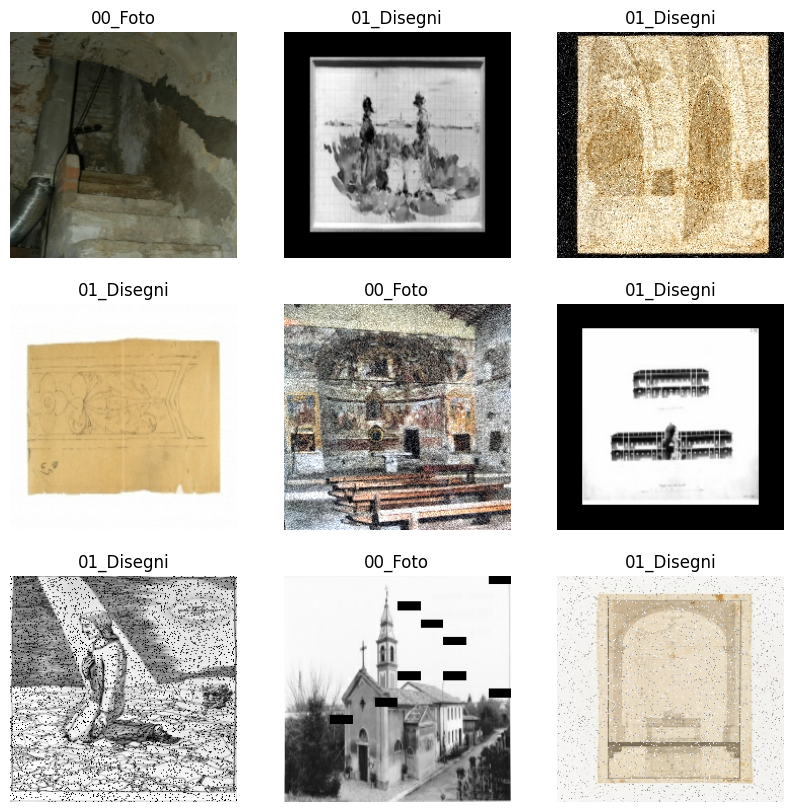

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")


In [ ]:
for image_batch, labels_batch in train_ds:
  print('Input batch size  ',image_batch.shape)
  print('Output batch size ',labels_batch.shape)
  break

Input batch size   (32, 224, 224, 3)
Output batch size  (32,)


In [ ]:
"""""""""""""""""""""""""""""""""""""""""""""""""""""""""
DataSet
"""""""""""""""""""""""""""""""""""""""""""""""""""""""""
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

In [ ]:
#Delete file to increase disk space
#!rm -r $DATA_FOLDER

In [ ]:
#!du -sh kt_dir | awk '{print $1}'

In [ ]:
#!rm -r kt_dir

#Test Data

### Copy data from Drive

In [ ]:
DATA_FOLDER= 'Test'
AUGMENT_SET= False

In [ ]:
#Real Images
!cp -r  '/content/gdrive/MyDrive/Colab Notebooks/ReAD/01_Photo_Draw/'$DATA_FOLDER /content

In [ ]:
!find '/content/'$DATA_FOLDER -maxdepth 2 -mindepth 2 -type f -printf "%h\0" | uniq -zc | tr '\0' '\n'

    152 /content/Test/01_Disegni
    141 /content/Test/00_Foto


### Load Data

In [ ]:
#Real Images
data_dir=pathlib.Path('Test')
print('Test set')
image_count = len(list(data_dir.glob('00_Foto/*.jpg')))
print('0 images:', image_count)

image_count = len(list(data_dir.glob('01_Disegni/*.jpg')))
print('1 images:', image_count)

image_count = len(list(data_dir.glob('*/*.jpg')))   #'*/*.jpg'
print('Tot num. of images:', image_count)


Test set
0 images: 141
1 images: 152
Tot num. of images: 293


In [ ]:
#list(data_dir.glob('*/*.jpg'))

In [ ]:
list_ds = tf.data.Dataset.list_files(str(data_dir/'*/*.jpg'), shuffle=False)

In [ ]:
class_names = np.array(sorted([item.name for item in data_dir.glob('*') if item.name != '.ipynb_checkpoints']))
print(class_names)

['00_Foto' '01_Disegni']


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
batch_size = 32
img_height = 224
img_width = 224
layers = 3

test_ds = list_ds.map(process_path, num_parallel_calls=AUTOTUNE)

In [ ]:
for image, label in test_ds.take(1):
  print("Image shape: ", image.numpy().shape)
  print("Label: ", label.numpy())

Image shape:  (224, 224, 3)
Label:  0


In [ ]:
if AUGMENT_SET:
  test_ds= augment_ds(test_ds, n= N_AUGMENT)

# Model Tuning or Train

## Tuning Hyperparam

Extract features only one time, but optimize VSS and ResNet separatly

[Using Tensorboard](https://keras.io/guides/keras_tuner/visualize_tuning/)

In [ ]:
# Def the model iperparam optimizer

def build_model_tuner(hp):
  """
  WARNING THIS RETURN ONLY THE CLASSIFIER (not the features extractor)
  Use only for tuning.

  Builds model and sets up hyperparameter space to search.

  Parameters
  ----------
  hp : HyperParameter object
       Configures hyperparameters to tune.

  Returns
  -------
  model : keras model
      Compiled model with hyperparameters to tune.
  """
  # Initialize the Pretrained Model
  pretrain_mod= "res" #vgg

  pretrain_trainable= False

  # Tune the number of hidden layers and units in each.
  # Number of hidden layers: 1 - 5
  # Number of Units: 64 - 512 with stepsize of 32
  units= hp.Int("units", min_value=512, max_value=1024, step=128)

  activation=hp.Choice("activation", ['relu', 'tanh', 'sigmoid'])

  num_layers= hp.Int("num_layers", 3, 6) #hp.Int("num_layers", 2, 6)
  drops=[0.2,0.2,0.2,0.2,0.2]
  '''
  for i in range(1, num_layers):
    # Tune dropout layer with values from 0 - 0.3 with stepsize of 0.1.
    drops.append(hp.Float("dropout_" + str(i), 0, 0.3, step=0.1))
  '''
  # Set the pooling layer
  global_pooling= hp.Choice("global_pooling", ["max", "avg", 'flt'])

  # Tune learning rate for Adam optimizer with values from 0.01, 0.001, or 0.0001
  learning_rate = 1e-3 #hp.Choice("learning_rate", values=[1e-3, 1e-4]) #hp.Choice("learning_rate", values=[1e-2, 1e-3, 1e-4])

  opt_type= 'Adam' #hp.Choice('opt_type', values=['Adam','SGD'])

  model= create_model(pretrain_mod,
                 pretrain_trainable,
                 units,
                 num_layers,
                 activation,
                 dropout= drops,
                 global_pooling= global_pooling,
                 learning_rate= learning_rate ,
                 opt_type= opt_type
                 )

  #return only the classifier
  classifier= tf.keras.Model(model.get_layer('feature').input,
                             model.output,
                             name='classifier')
  classifier.compile(optimizer= model.optimizer, loss= model.loss, metrics=model.metrics)

  return classifier

In [ ]:
#Now extract features only one time
#WARNING: the pretrain_mod (= 'vgg' or 'res' ) must be the same of the model istance

model= model = create_model(
    pretrain_mod= 'res')
feat_extractor= tf.keras.Model(model.input,
                               model.get_layer('feature').input,
                               name= 'f_extractor')
feat_extractor.summary()

In [ ]:
#Test set Extract Features
labels_list= []
feat_list= []

for image_batch, labels_batch in train_ds:

  feat_batch= feat_extractor(image_batch)

  labels_list.append(list(labels_batch.numpy()))
  feat_list.append(list(feat_batch.numpy()))

feat_list= np.vstack(feat_list)
print('Out features size ',feat_list.shape)

labels_list= np.concatenate(labels_list)
print('Out label size ',labels_list.shape)

feat_train_ds= tf.data.Dataset.from_tensor_slices((feat_list, labels_list))
feat_train_ds = configure_for_performance(feat_train_ds, batch_size, AUTOTUNE)

In [ ]:
#Validation set Extract Features
labels_list= []
feat_list= []

for image_batch, labels_batch in val_ds:

  feat_batch= feat_extractor(image_batch)

  labels_list.append(list(labels_batch.numpy()))
  feat_list.append(list(feat_batch.numpy()))

feat_list= np.vstack(feat_list)
print('Out features size ',feat_list.shape)

labels_list= np.concatenate(labels_list)
print('Out label size ',labels_list.shape)

feat_val_ds= tf.data.Dataset.from_tensor_slices((feat_list, labels_list))
feat_val_ds = configure_for_performance(feat_val_ds, batch_size, AUTOTUNE)

In [ ]:
del feat_list, labels_list
gc.collect()

In [ ]:
# Instantiate the tuner
tuner = kt.Hyperband(build_model_tuner,
                     objective=kt.Objective("val_loss", direction="min"),
                     max_epochs=15,
                     factor=3,
                     hyperband_iterations=10,
                     directory="kt_dir",
                     project_name="kt_hyperband",)

In [ ]:
# Display search space summary
tuner.search_space_summary()

In [ ]:
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', min_delta=0.001, patience=5)
tens_b = tf.keras.callbacks.TensorBoard("./tb_logs")

tuner.search(x= feat_train_ds,
             validation_data= feat_val_ds,
             callbacks= [stop_early], #[stop_early, tens_b],
             verbose= 2)


In [ ]:
#Load TensorBoard
%load_ext tensorboard

%tensorboard --logdir ./tb_logs

In [ ]:
#Show summary
tuner.results_summary(5)

In [ ]:
# Get the optimal hyperparameters from the results
best_hps=tuner.get_best_hyperparameters()[0]

# Build model
model = tuner.hypermodel.build(best_hps)

In [ ]:
print ('Best param\n', best_hps)

##Training

In [ ]:
# Check for negative values

x,y = next(iter(train_ds))

val = tf.constant([0], dtype=tf.uint8)
print(tf.where(tf.math.less(x, val)))

print(tf.reduce_min(x))
print(tf.reduce_max(x))

tf.Tensor([], shape=(0, 4), dtype=int64)
tf.Tensor(0, shape=(), dtype=uint8)
tf.Tensor(255, shape=(), dtype=uint8)


In [ ]:
#Modello 2
#Per ora questo è il migliore: 95 f1 score su test set
model = create_model(
    pretrain_mod= 'vgg',
    #pretrain_trainable=True,
    units= 768,
    activation= 'relu',
    num_layers= 3,
    global_pooling= 'flt',
    #learning_rate= 1e-07,
    opt_type= 'Adam',
    dropout= [0.2,0.2,0.2,0.2,0.2]
    )

"\nmodel = create_model(\n    pretrain_mod= 'vgg',\n    #pretrain_trainable=True,\n    units= 512,\n    activation= 'relu',\n    num_layers= 5,\n    global_pooling= 'flt',\n    #learning_rate= 1e-07,\n    opt_type= 'Adam',\n    dropout= [0.2,0.2,0.2,0.2,0.2]\n    )\n"

In [ ]:
model.summary()

Model: "model_903"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2709 (InputLayer)     [(None, 224, 224, 3)]     0         
                                                                 
 rescaling_903 (Rescaling)   (None, 224, 224, 3)       0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 feature (Dense)             (None, 7, 7, 192)         98496     
                                                                 
 dropout_3611 (Dropout)      (None, 7, 7, 192)         0         
                                                                 
 Dense_2 (Dense)             (None, 7, 7, 96)          18528     
                                                                 
 dropout_3612 (Dropout)      (None, 7, 7, 96)          0 

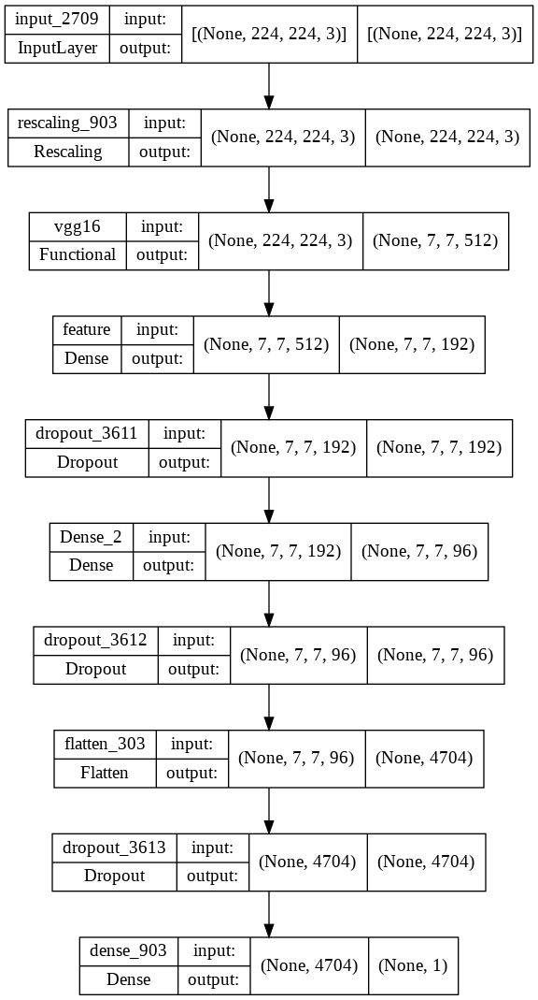

In [ ]:
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

### Train

In [ ]:
#Check the learning rate and change
print("Learning rate before second fit:", model.optimizer.learning_rate.numpy())

#K.set_value(model.optimizer.learning_rate, 1e-4)
print("Learning rate before second fit:", model.optimizer.learning_rate.numpy())

Learning rate before second fit: 0.001
Learning rate before second fit: 0.001


In [ ]:
checkpoint_filepath = './model/only_weights'


save_ck_point = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    mode='min',
    min_delta=0.0001, # minimium amount of change to count as an improvement
    patience=10, # how many epochs to wait before stopping
    restore_best_weights=True,
)


tens_b = tf.keras.callbacks.TensorBoard("./tb_logs",
                                        histogram_freq=1)

In [ ]:
NUM_EPOCHS=100
# Train the hypertuned model
history= model.fit(x= train_ds,
                   validation_data= val_ds,
                   epochs=NUM_EPOCHS,
                   shuffle=True,
                   callbacks=[ save_ck_point, tens_b, early_stopping ]
                   #validation_steps = len(list(val_ds.as_numpy_iterator())) // batch_size
                   )

Epoch 1/100
208/208 [==============================] - 43s 195ms/step - loss: 0.3413 - accuracy: 0.8494 - f1_m: 0.8491 - val_loss: 0.1699 - val_accuracy: 0.9367 - val_f1_m: 0.9421
Epoch 2/100
208/208 [==============================] - 38s 185ms/step - loss: 0.2079 - accuracy: 0.9151 - f1_m: 0.9155 - val_loss: 0.1170 - val_accuracy: 0.9608 - val_f1_m: 0.9661
Epoch 3/100
208/208 [==============================] - 40s 190ms/step - loss: 0.1590 - accuracy: 0.9366 - f1_m: 0.9357 - val_loss: 0.0892 - val_accuracy: 0.9789 - val_f1_m: 0.9794
Epoch 4/100
208/208 [==============================] - 38s 184ms/step - loss: 0.1165 - accuracy: 0.9567 - f1_m: 0.9566 - val_loss: 0.0691 - val_accuracy: 0.9729 - val_f1_m: 0.9765
Epoch 5/100
208/208 [==============================] - 38s 184ms/step - loss: 0.0830 - accuracy: 0.9699 - f1_m: 0.9698 - val_loss: 0.0536 - val_accuracy: 0.9880 - val_f1_m: 0.9892
Epoch 6/100
208/208 [==============================] - 38s 184ms/step - loss: 0.0680 - accuracy: 0.9

Epoch 12/100
208/208 [==============================] - 42s 204ms/step - loss: 0.1463 - accuracy: 0.9480 - f1_m: 0.9471 - val_loss: 0.0574 - val_accuracy: 0.9880 - val_f1_m: 0.9882

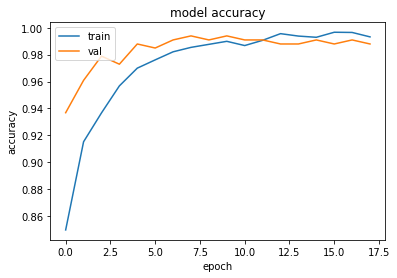

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

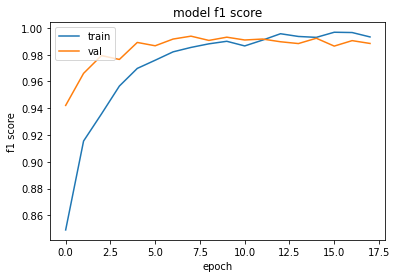

In [ ]:
plt.plot(history.history['f1_m'])
plt.plot(history.history['val_f1_m'])
plt.title('model f1 score')
plt.ylabel('f1 score')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

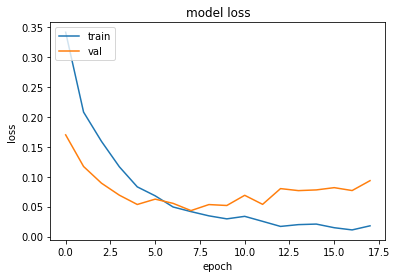

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

### Save weights

In [ ]:
# Save the weights
### non usare piu -> model.save_weights('./model/only_weights')

In [ ]:
#Copy weights to Drive
#!cp -r ./model '/content/gdrive/MyDrive/Colab Notebooks/ReAD/01_Photo_Draw/'

##Training on ALL Dataset

In [ ]:
#Merge dataset
train_ds= train_ds.concatenate(val_ds)
#Shuffle
train_ds= train_ds.shuffle(buffer_size= len(list(train_ds.as_numpy_iterator())))

In [ ]:
# Create a new model instance

model = create_model(
    pretrain_mod= 'vgg',
    #pretrain_trainable=True,
    units= 768,
    activation= 'relu',
    num_layers= 3,
    global_pooling= 'flt',
    #learning_rate= 1e-07,
    opt_type= 'Adam',
    dropout= [0.2,0.2,0.2,0.2,0.2]
    )

"\nmodel = create_model(\n    pretrain_mod= 'vgg',\n    #pretrain_trainable=True,\n    units= 640,\n    activation= 'sigmoid',\n    num_layers= 5,\n    global_pooling= 'flt',\n    #learning_rate= 1e-07,\n    opt_type= 'Adam',\n    dropout= [0.2,0.2,0.2,0.2,0.2]\n    )\n"

In [ ]:
checkpoint_filepath = './model/only_weights'


save_ck_point = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='loss',
    mode='min',
    save_best_only=True)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='loss',
    mode='min',
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=5,      # how many epochs to wait before stopping
    restore_best_weights=True,
)


tens_b = tf.keras.callbacks.TensorBoard("./tb_logs",
                                        histogram_freq=1)

In [ ]:
NUM_EPOCHS=20
# Train the hypertuned model
history= model.fit(x= train_ds,
                   epochs=NUM_EPOCHS,
                   shuffle=True,
                   callbacks=[ save_ck_point, tens_b, early_stopping ]
                   #validation_steps = len(list(val_ds.as_numpy_iterator())) // batch_size
                   )

Epoch 1/20
260/260 [==============================] - 55s 206ms/step - loss: 0.3635 - accuracy: 0.8459 - f1_m: 0.8428
Epoch 2/20
260/260 [==============================] - 49s 187ms/step - loss: 0.2757 - accuracy: 0.8980 - f1_m: 0.8972
Epoch 3/20
260/260 [==============================] - 49s 187ms/step - loss: 0.2474 - accuracy: 0.9061 - f1_m: 0.9050
Epoch 4/20
260/260 [==============================] - 49s 188ms/step - loss: 0.2249 - accuracy: 0.9135 - f1_m: 0.9134
Epoch 5/20
260/260 [==============================] - 49s 185ms/step - loss: 0.1973 - accuracy: 0.9262 - f1_m: 0.9264
Epoch 6/20
260/260 [==============================] - 51s 193ms/step - loss: 0.1930 - accuracy: 0.9324 - f1_m: 0.9320
Epoch 7/20
260/260 [==============================] - 50s 190ms/step - loss: 0.1736 - accuracy: 0.9373 - f1_m: 0.9377
Epoch 8/20
260/260 [==============================] - 50s 191ms/step - loss: 0.1596 - accuracy: 0.9441 - f1_m: 0.9443
Epoch 9/20
260/260 [==============================] - 47

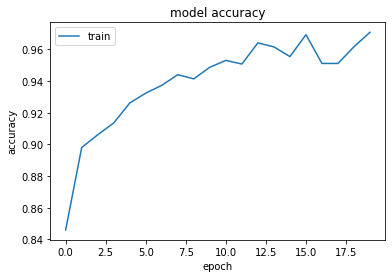

In [ ]:
plt.plot(history.history['accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()

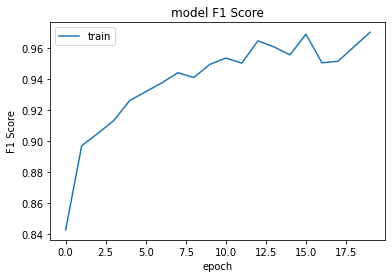

In [ ]:
plt.plot(history.history['f1_m'])
plt.title('model F1 Score')
plt.ylabel('F1 Score')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()

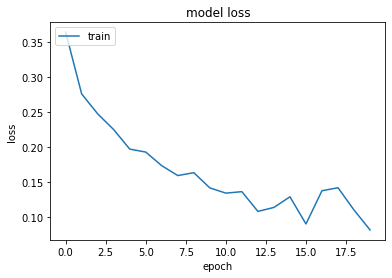

In [ ]:
plt.plot(history.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()

### Save weights

In [ ]:
# Save the weights
#model.save_weights('./model/only_weights')

In [ ]:
#Copy weights to Drive
#!cp -r ./model '/content/gdrive/MyDrive/Colab Notebooks/ReAD/01_Photo_Draw/'

## Model Evaluation


### Load model and weights

In [ ]:
#Copy model from Drive
!cp -r '/content/gdrive/MyDrive/Colab Notebooks/ReAD/01_Photo_Draw/model' ./

In [ ]:
model = create_model(
    pretrain_mod= 'vgg',
    #pretrain_trainable=True,
    units= 768,
    activation= 'relu',
    num_layers= 3,
    global_pooling= 'flt',
    #learning_rate= 1e-07,
    opt_type= 'Adam',
    dropout= [0.2,0.2,0.2,0.2,0.2]
    )

# Restore the weights
model.load_weights('./model/only_weights')

### Eval on test set

1/1 [==============================] - 0s 26ms/step

00_Foto -> 01_Disegni


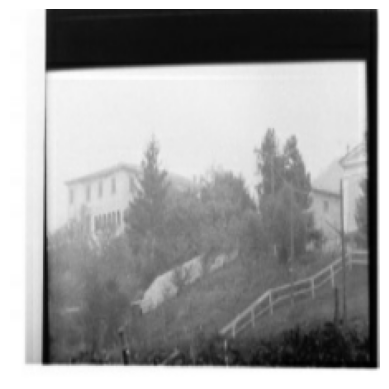

1/1 [==============================] - 0s 31ms/step

00_Foto -> 01_Disegni


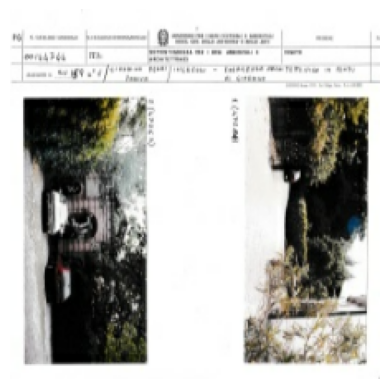

1/1 [==============================] - 0s 32ms/step

00_Foto -> 01_Disegni


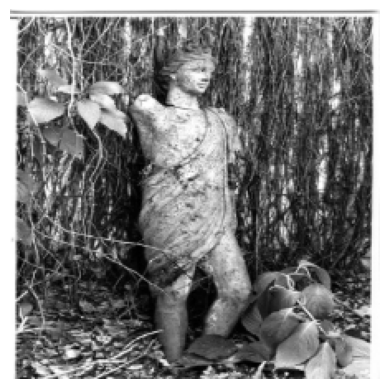

1/1 [==============================] - 0s 21ms/step

00_Foto -> 01_Disegni


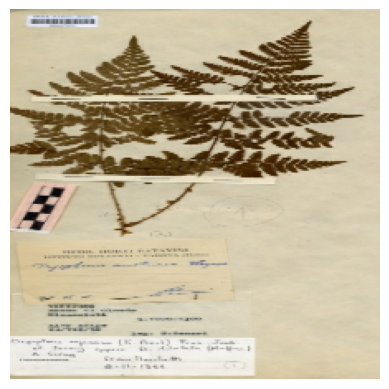

1/1 [==============================] - 0s 18ms/step

01_Disegni -> 00_Foto


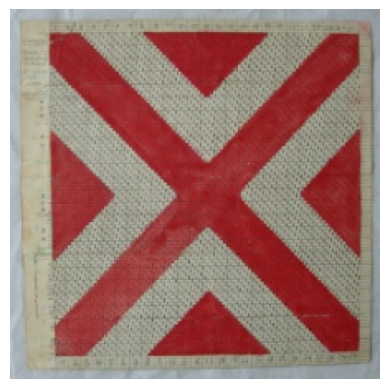

1/1 [==============================] - 0s 21ms/step

01_Disegni -> 00_Foto


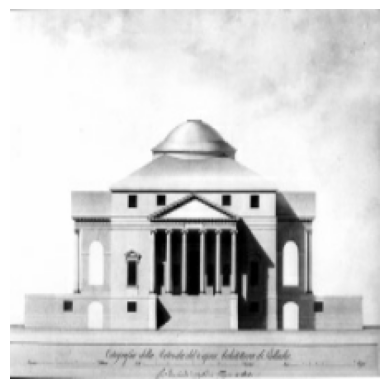

1/1 [==============================] - 0s 20ms/step

01_Disegni -> 00_Foto


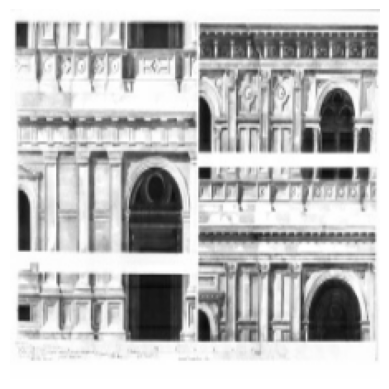

1/1 [==============================] - 0s 35ms/step

01_Disegni -> 00_Foto


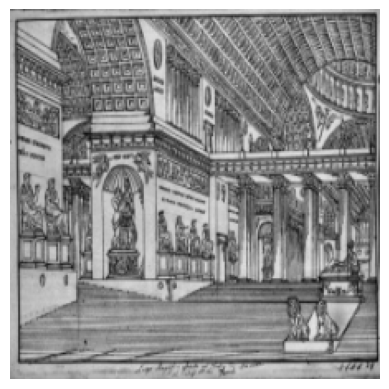

1/1 [==============================] - 0s 33ms/step

01_Disegni -> 00_Foto


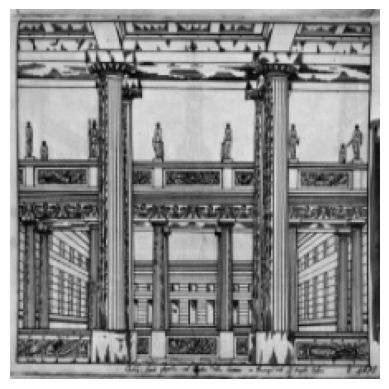

1/1 [==============================] - 0s 42ms/step

01_Disegni -> 00_Foto


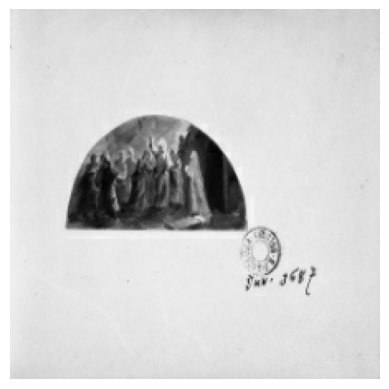

1/1 [==============================] - 0s 60ms/step

01_Disegni -> 00_Foto


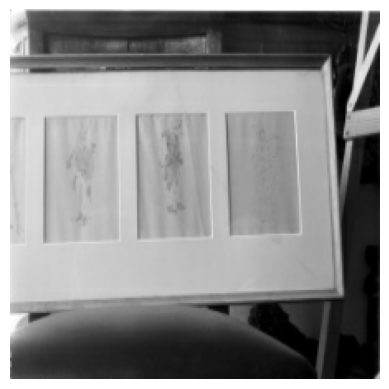

1/1 [==============================] - 0s 20ms/step

01_Disegni -> 00_Foto


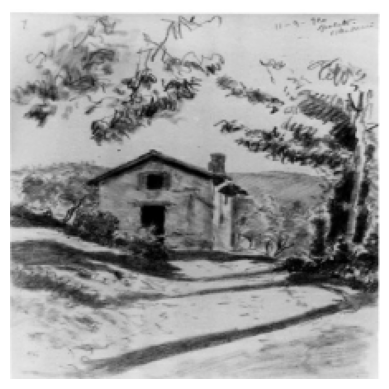

1/1 [==============================] - 0s 22ms/step

01_Disegni -> 00_Foto


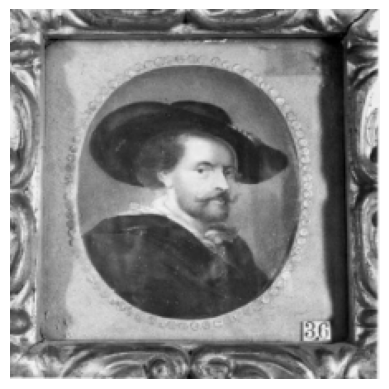

1/1 [==============================] - 0s 30ms/step

01_Disegni -> 00_Foto


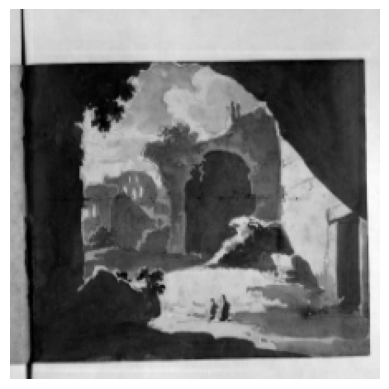

1/1 [==============================] - 0s 26ms/step

01_Disegni -> 00_Foto


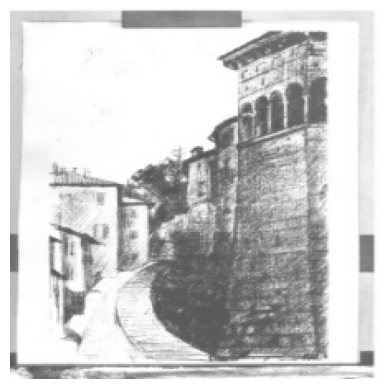

1/1 [==============================] - 0s 21ms/step


In [ ]:
#Run over all test set and display only the miss-prediction
pred_labels=[]
real_labels=[]
for image, label in test_ds:
  y_real= label.numpy()
  y_pred= np.round(model.predict(np.expand_dims(image, axis=0))).astype(int)[0][0]
  if y_real != y_pred:
    print('\n'+ class_names[y_real],'->', class_names[y_pred])
    plt.imshow(image.numpy().astype("uint8"))
    plt.axis("off")
    plt.show()

  real_labels.append(y_real)
  pred_labels.append(y_pred)


Normal


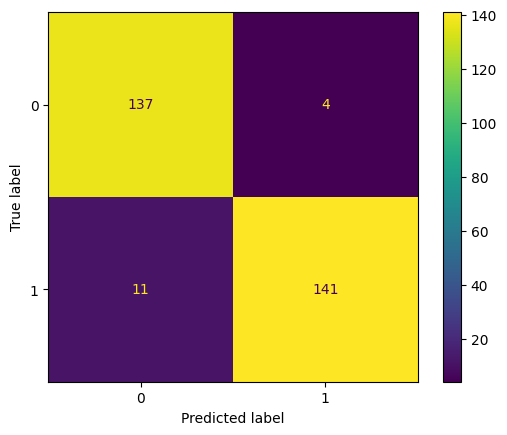


Classification Report
              precision    recall  f1-score   support

     00_Foto       0.93      0.97      0.95       141
  01_Disegni       0.97      0.93      0.95       152

    accuracy                           0.95       293
   macro avg       0.95      0.95      0.95       293
weighted avg       0.95      0.95      0.95       293



In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt
# Normal
print('Normal')
cm = confusion_matrix(real_labels, pred_labels)
#print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

plt.savefig('normal.png')
plt.show()

print('\nClassification Report')
print(classification_report(real_labels, pred_labels, target_names=class_names))

# Tensorboard

In [ ]:
#Load TensorBoard
%load_ext tensorboard

%tensorboard --logdir ./tb_logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 18581), started 0:15:20 ago. (Use '!kill 18581' to kill it.)

<IPython.core.display.Javascript object>